In [3]:
import keras
import tensorflow as tf
from keras import layers, models
import matplotlib.pyplot as plt
import numpy as np

from keras.applications import (
    ResNet50, ResNet50V2, ResNet101, MobileNet, MobileNetV3Small,
    NASNetMobile, EfficientNetB0, EfficientNetB7, InceptionV3, InceptionResNetV2
)
from keras.applications.resnet import preprocess_input as resnet_preprocess
from keras.applications.resnet_v2 import preprocess_input as resnet_v2_preprocess
from keras.applications.mobilenet import preprocess_input as mobilenet_preprocess
from keras.applications.mobilenet_v3 import preprocess_input as mobilenet_v3_preprocess
from keras.applications.nasnet import preprocess_input as nasnet_preprocess
from keras.applications.efficientnet import preprocess_input as efficientnet_preprocess
from keras.applications.inception_v3 import preprocess_input as inception_v3_preprocess
from keras.applications.inception_resnet_v2 import preprocess_input as inception_resnet_v2_preprocess

# Load dataset ( I made this dataset by myself btw hihi)
train_path = r'D:/Amr/Portfolio/All time project/ready to publish/DL/project 5/dataset/train'
val_path = r'D:/Amr/Portfolio/All time project/ready to publish/DL/project 5/dataset/val'
test_path = r'D:/Amr/Portfolio/All time project/ready to publish/DL/project 5/dataset/test'

SEED = 42
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

train_ds = tf.keras.utils.image_dataset_from_directory(
    train_path,
    shuffle=True,
    pad_to_aspect_ratio=True,
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)
val_ds = tf.keras.utils.image_dataset_from_directory(
    val_path,
    shuffle=True,
    pad_to_aspect_ratio=True,
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)
test_ds = tf.keras.utils.image_dataset_from_directory(
    test_path,
    shuffle=False, 
    pad_to_aspect_ratio=True,
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

class_names = train_ds.class_names
NUM_CLASSES = len(class_names)
print(f"Detected {NUM_CLASSES} classes: {class_names}")

Found 126 files belonging to 5 classes.
Found 19 files belonging to 5 classes.
Found 19 files belonging to 5 classes.
Detected 5 classes: ['bird', 'cow', 'fish', 'human', 'snake']


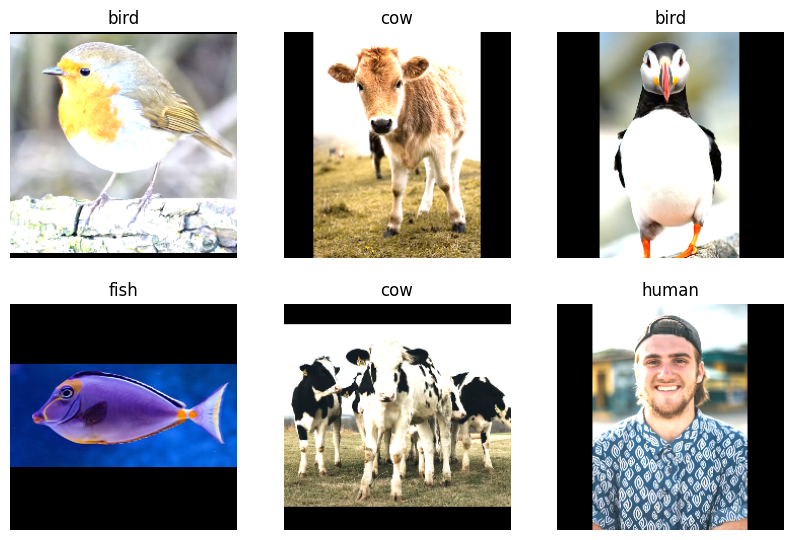

In [17]:
# Visualize
images, labels = next(iter(train_ds))
plt.figure(figsize=(10,10))
for i in range(6):
    plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

plt.show()

In [5]:
# Autotune and prefetch

# To avoid bottleneck I/O when CPU read picture and GPU doing training
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds   = val_ds.prefetch(buffer_size=AUTOTUNE)
test_ds  = test_ds.prefetch(buffer_size=AUTOTUNE)


=== ResNet50 ===


Model: "ResNet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 224, 224)  │          0 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 224, 224)  │          0 │ input_layer_1[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 224, 224)  │          0 │ input_layer_1[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 224, 224,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 224, 224,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 7, 7,      │ 23,587,712 │ add[0][0]         │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet50[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 2048)      │      8,192 │ global_average_p… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 2048)      │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 5)         │     10,245 │ dropout[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 23,606,149 (90.05 MB)

 Trainable params: 14,341 (56.02 KB)

 Non-trainable params: 23,591,808 (90.00 MB)


Training Classification Head - ResNet50
Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.2619 - loss: 2.2334 - val_accuracy: 0.6316 - val_loss: 1.0668
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 543ms/step - accuracy: 0.6746 - loss: 0.8141 - val_accuracy: 0.8421 - val_loss: 0.5712
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 382ms/step - accuracy: 0.9127 - loss: 0.3032 - val_accuracy: 0.8947 - val_loss: 0.3568
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 390ms/step - accuracy: 0.9683 - loss: 0.1239 - val_accuracy: 0.8947 - val_loss: 0.2518
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 404ms/step - accuracy: 0.9921 - loss: 0.0631 - val_accuracy: 1.0000 - val_loss: 0.1948
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 406ms/step - accuracy: 1.0000 - loss: 0.0333 - val_accuracy: 1.0000 - val_loss: 0.1608
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 401ms/step - accuracy: 1.0000 - loss: 0.0157 - val_accuracy: 1.0000 - val_loss: 0.1387
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 405ms/step - accuracy: 1.0000 - loss: 0.0

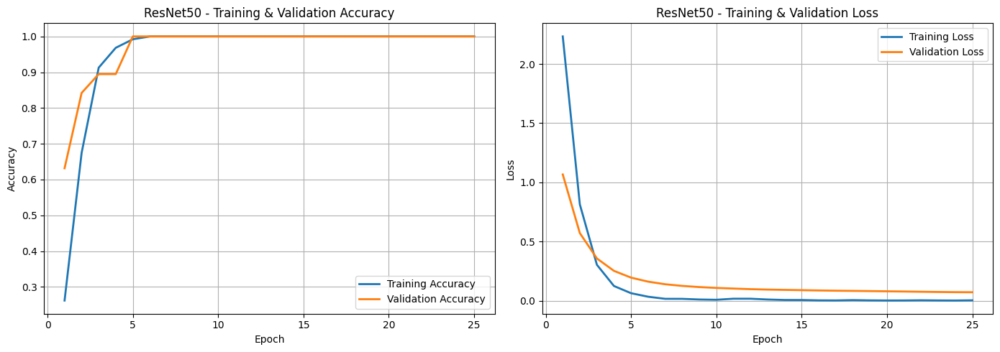

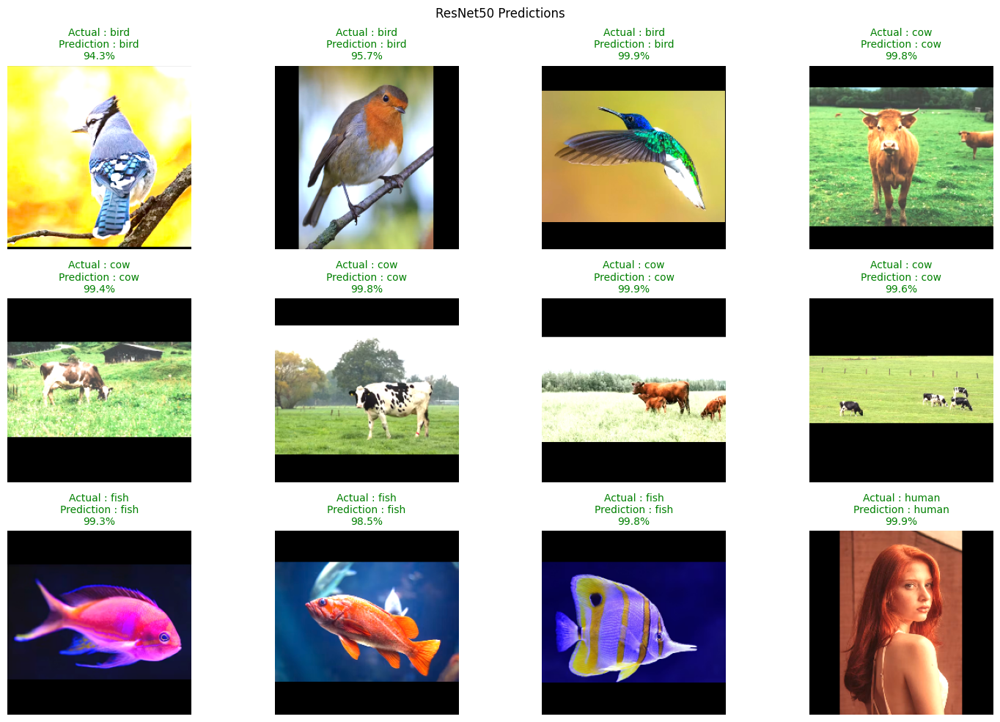


=== ResNet50V2 ===


Model: "ResNet50V2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50v2 (Functional)         │ (None, 7, 7, 2048)     │    23,564,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │        10,245 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,583,237 (89.96 MB)

 Trainable params: 14,341 (56.02 KB)

 Non-trainable params: 23,568,896 (89.91 MB)


Training Classification Head - ResNet50V2
Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 594ms/step - accuracy: 0.3413 - loss: 1.7330 - val_accuracy: 0.5263 - val_loss: 1.1774
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 349ms/step - accuracy: 0.7937 - loss: 0.5956 - val_accuracy: 0.8421 - val_loss: 0.7229
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 349ms/step - accuracy: 0.8730 - loss: 0.3256 - val_accuracy: 0.8421 - val_loss: 0.5200
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 344ms/step - accuracy: 0.9365 - loss: 0.1653 - val_accuracy: 0.8947 - val_loss: 0.4193
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 342ms/step - accuracy: 0.9683 - loss: 0.1283 - val_accuracy: 0.8947 - val_loss: 0.3572
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 321ms/step - accuracy: 1.0000 - loss: 0.0510 - val_accuracy: 0.8947 - val_loss: 0.3216
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 318ms/step - accuracy: 0.9921 - loss: 0.0535 - val_accuracy: 0.8947 - val_loss: 0.2968
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 319ms/step - accuracy: 0.9762 - loss

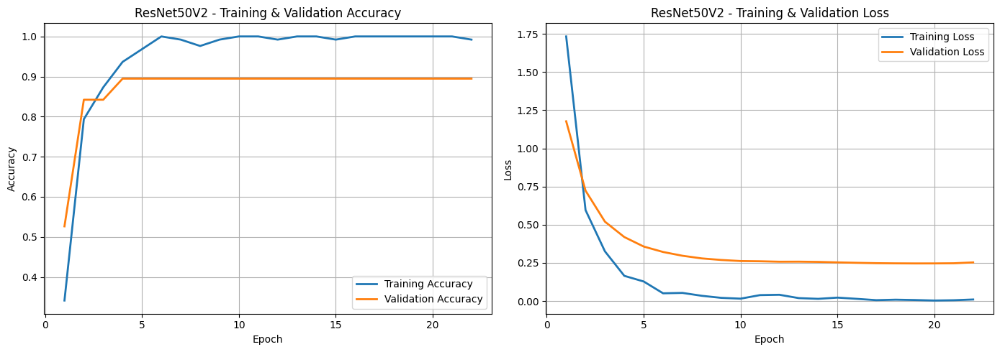

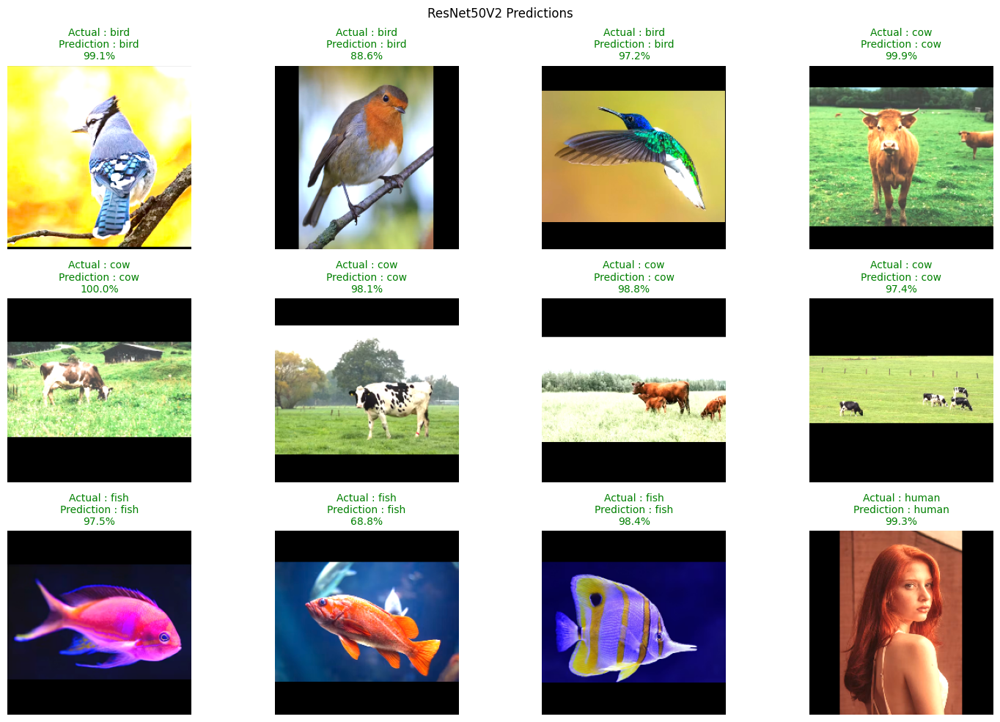


=== ResNet101 ===


Model: "ResNet101"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_3          │ (None, 224, 224)  │          0 │ input_layer_5[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_4          │ (None, 224, 224)  │          0 │ input_layer_5[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_5          │ (None, 224, 224)  │          0 │ input_layer_5[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack_1 (Stack)     │ (None, 224, 224,  │          0 │ get_item_3[0][0], │
│                     │ 3)                │            │ get_item_4[0][0], │
│                     │                   │            │ get_item_5[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 224, 224,  │          0 │ stack_1[0][0]     │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet101           │ (None, 7, 7,      │ 42,658,176 │ add_1[0][0]       │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet101[0][0]   │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 2048)      │      8,192 │ global_average_p… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 2048)      │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 5)         │     10,245 │ dropout_2[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 42,676,613 (162.80 MB)

 Trainable params: 14,341 (56.02 KB)

 Non-trainable params: 42,662,272 (162.74 MB)


Training Classification Head - ResNet101
Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.4444 - loss: 1.5427 - val_accuracy: 0.3684 - val_loss: 1.3039
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 654ms/step - accuracy: 0.7460 - loss: 0.6945 - val_accuracy: 0.6316 - val_loss: 0.8322
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 657ms/step - accuracy: 0.9206 - loss: 0.2351 - val_accuracy: 0.7368 - val_loss: 0.6290
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 659ms/step - accuracy: 0.9683 - loss: 0.1165 - val_accuracy: 0.7895 - val_loss: 0.5227
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 664ms/step - accuracy: 0.9921 - loss: 0.0542 - val_accuracy: 0.8421 - val_loss: 0.4564
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 656ms/step - accuracy: 1.0000 - loss: 0.0276 - val_accuracy: 0.8421 - val_loss: 0.4136
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 667ms/step - accuracy: 1.0000 - loss: 0.0191 - val_accuracy: 0.8421 - val_loss: 0.3822
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 661ms/step - accuracy: 1.0000 - loss: 0.

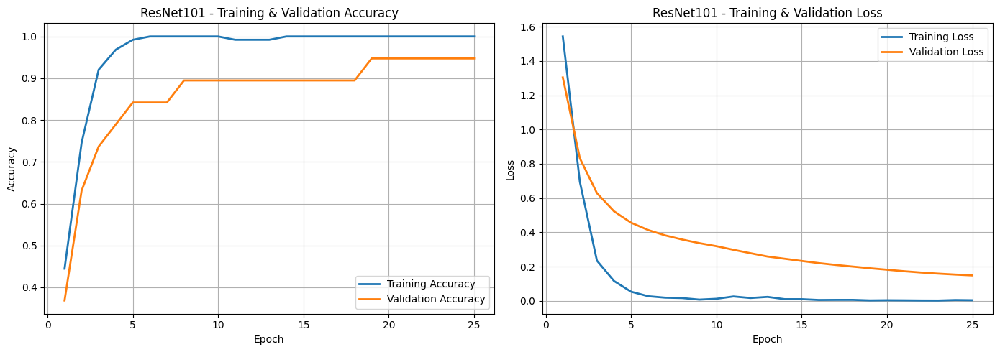

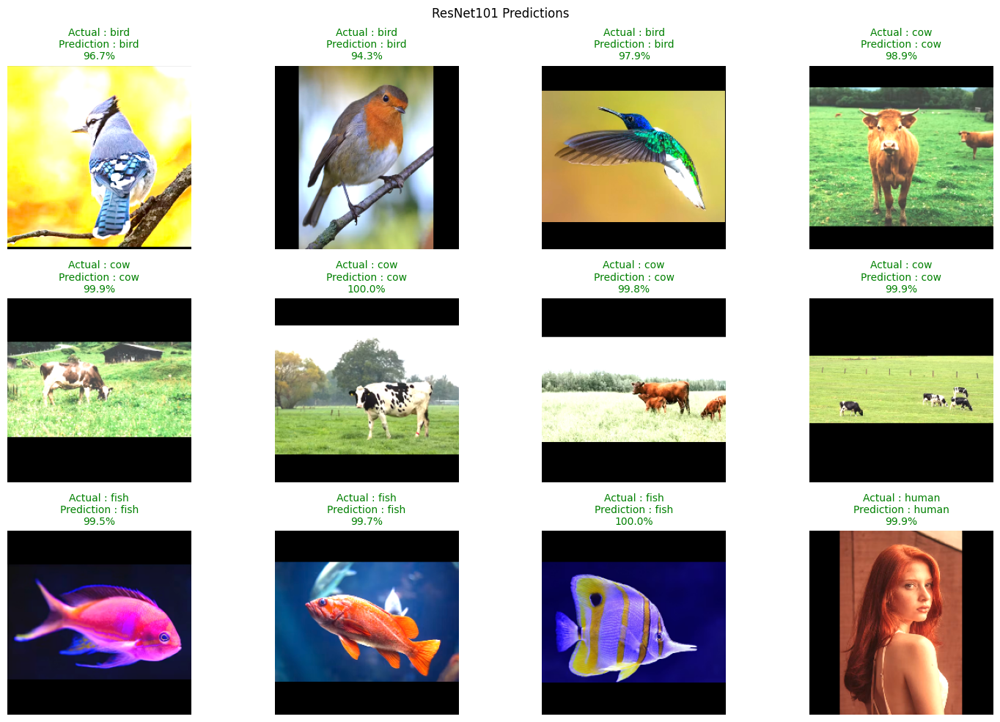


=== MobileNet ===


Model: "MobileNet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_1 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 7, 7, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │         5,125 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,238,085 (12.35 MB)

 Trainable params: 7,173 (28.02 KB)

 Non-trainable params: 3,230,912 (12.32 MB)


Training Classification Head - MobileNet
Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 230ms/step - accuracy: 0.2778 - loss: 2.2097 - val_accuracy: 0.5263 - val_loss: 1.3178
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.5238 - loss: 1.3531 - val_accuracy: 0.5789 - val_loss: 1.1054
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - accuracy: 0.7778 - loss: 0.6688 - val_accuracy: 0.5789 - val_loss: 0.9479
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - accuracy: 0.8730 - loss: 0.4252 - val_accuracy: 0.5789 - val_loss: 0.8154
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.8810 - loss: 0.3376 - val_accuracy: 0.6316 - val_loss: 0.6992
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - accuracy: 0.9444 - loss: 0.1785 - val_accuracy: 0.6316 - val_loss: 0.5984
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.9524 - loss: 0.1355 - val_accuracy: 0.7368 - val_loss: 0.5093
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 128ms/step - accuracy: 0.9921 - loss:

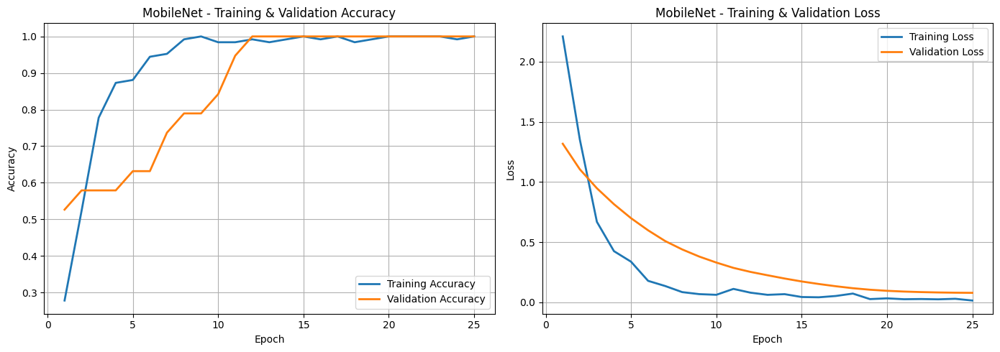

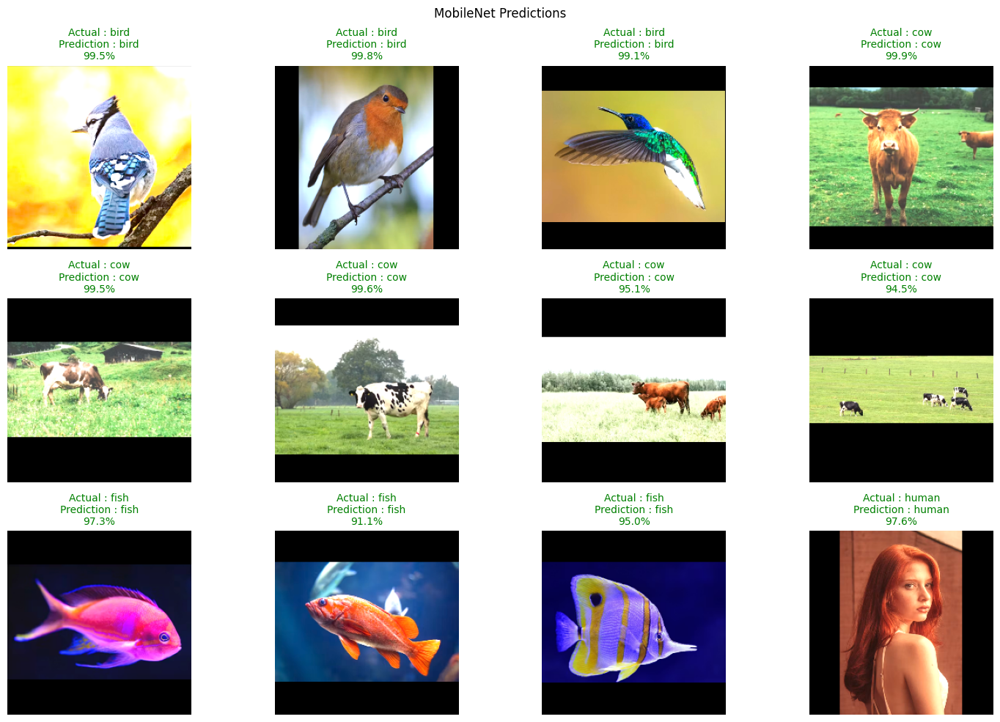


=== MobileNetV3Small ===


Model: "MobileNetV3Small"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MobileNetV3Small (Functional)   │ (None, 7, 7, 576)      │       939,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 576)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 576)            │         2,304 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 576)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 5)              │         2,885 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 944,309 (3.60 MB)

 Trainable params: 4,037 (15.77 KB)

 Non-trainable params: 940,272 (3.59 MB)


Training Classification Head - MobileNetV3Small
Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 243ms/step - accuracy: 0.2222 - loss: 2.5325 - val_accuracy: 0.2105 - val_loss: 2.2617
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.3968 - loss: 1.6521 - val_accuracy: 0.2632 - val_loss: 1.8842
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.6111 - loss: 1.1196 - val_accuracy: 0.4211 - val_loss: 1.5740
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.7063 - loss: 0.8106 - val_accuracy: 0.4737 - val_loss: 1.3215
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.7778 - loss: 0.6653 - val_accuracy: 0.6316 - val_loss: 1.1285
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.7937 - loss: 0.5688 - val_accuracy: 0.5789 - val_loss: 0.9828
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.8571 - loss: 0.4049 - val_accuracy: 0.5789 - val_loss: 0.8729
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.9127 - loss:

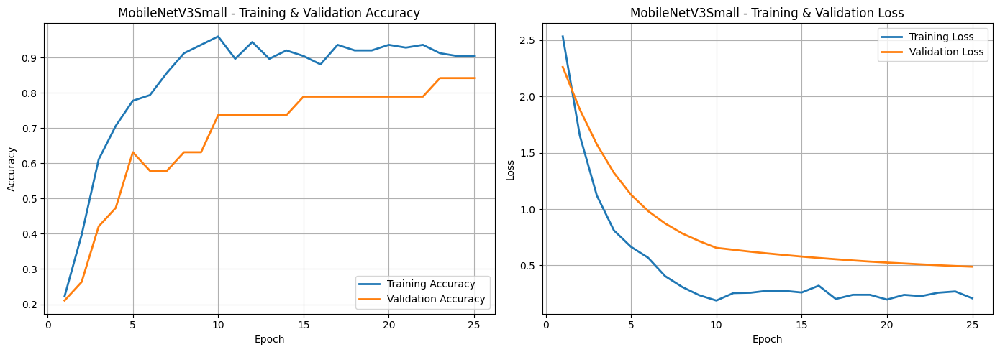

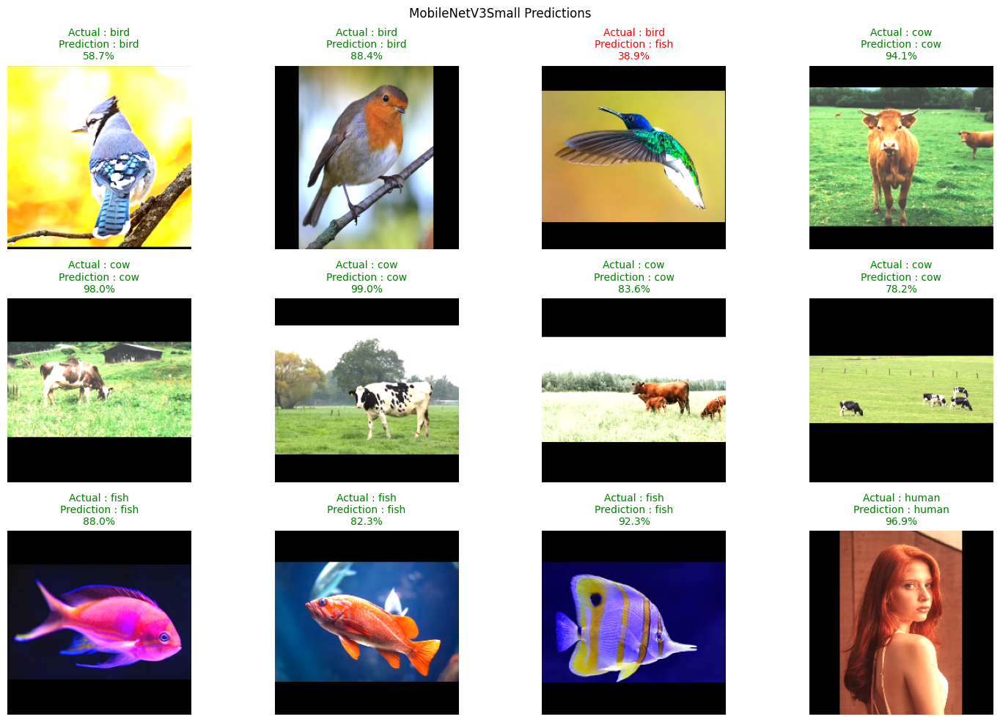


=== NASNetMobile ===


Model: "NASNetMobile"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_2 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_2 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ nasnet_mobile (Functional)      │ (None, 7, 7, 1056)     │     4,269,716 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_5      │ (None, 1056)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 1056)           │         4,224 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 1056)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 5)              │         5,285 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,279,225 (16.32 MB)

 Trainable params: 7,397 (28.89 KB)

 Non-trainable params: 4,271,828 (16.30 MB)


Training Classification Head - NASNetMobile
Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 944ms/step - accuracy: 0.3730 - loss: 1.6087 - val_accuracy: 0.4737 - val_loss: 1.2585
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - accuracy: 0.6905 - loss: 0.8694 - val_accuracy: 0.6842 - val_loss: 0.9859
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - accuracy: 0.8254 - loss: 0.4672 - val_accuracy: 0.7895 - val_loss: 0.7863
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - accuracy: 0.8810 - loss: 0.3014 - val_accuracy: 0.8421 - val_loss: 0.6473
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - accuracy: 0.9444 - loss: 0.1936 - val_accuracy: 0.9474 - val_loss: 0.5489
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - accuracy: 0.9841 - loss: 0.1153 - val_accuracy: 0.9474 - val_loss: 0.4780
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - accuracy: 0.9841 - loss: 0.0838 - val_accuracy: 0.9474 - val_loss: 0.4238
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - accuracy: 1.0000 - l

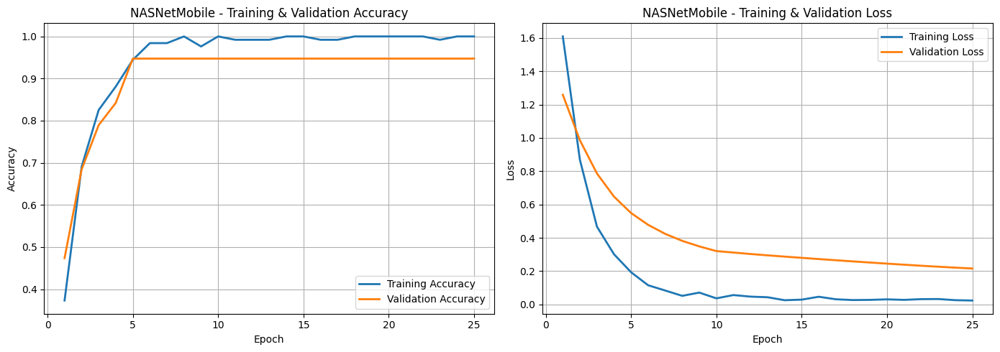

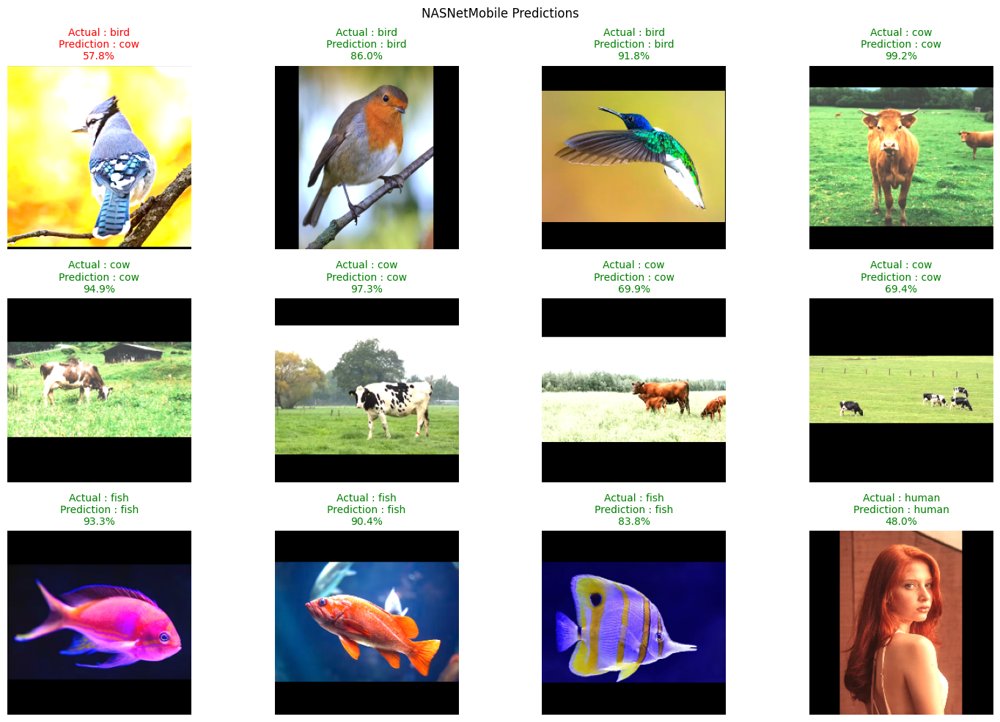


=== EfficientNetB0 ===


Model: "EfficientNetB0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_6      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 5)              │         6,405 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,061,096 (15.49 MB)

 Trainable params: 8,965 (35.02 KB)

 Non-trainable params: 4,052,131 (15.46 MB)


Training Classification Head - EfficientNetB0
Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 532ms/step - accuracy: 0.2778 - loss: 2.2950 - val_accuracy: 0.3684 - val_loss: 1.4211
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - accuracy: 0.5476 - loss: 1.2246 - val_accuracy: 0.6316 - val_loss: 1.1562
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - accuracy: 0.7619 - loss: 0.6156 - val_accuracy: 0.7368 - val_loss: 0.9615
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 197ms/step - accuracy: 0.9127 - loss: 0.3224 - val_accuracy: 0.7895 - val_loss: 0.8177
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - accuracy: 0.9444 - loss: 0.1884 - val_accuracy: 0.8421 - val_loss: 0.7148
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - accuracy: 0.9921 - loss: 0.1198 - val_accuracy: 0.8421 - val_loss: 0.6389
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - accuracy: 0.9841 - loss: 0.0750 - val_accuracy: 0.8421 - val_loss: 0.5832
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - accuracy: 0.9683 - 

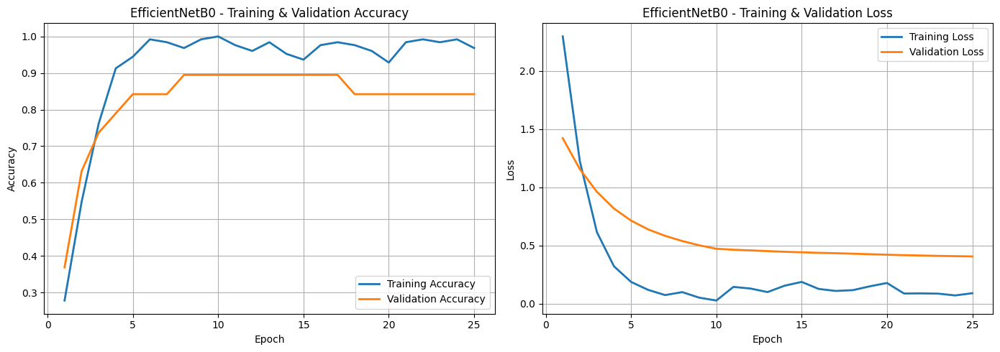

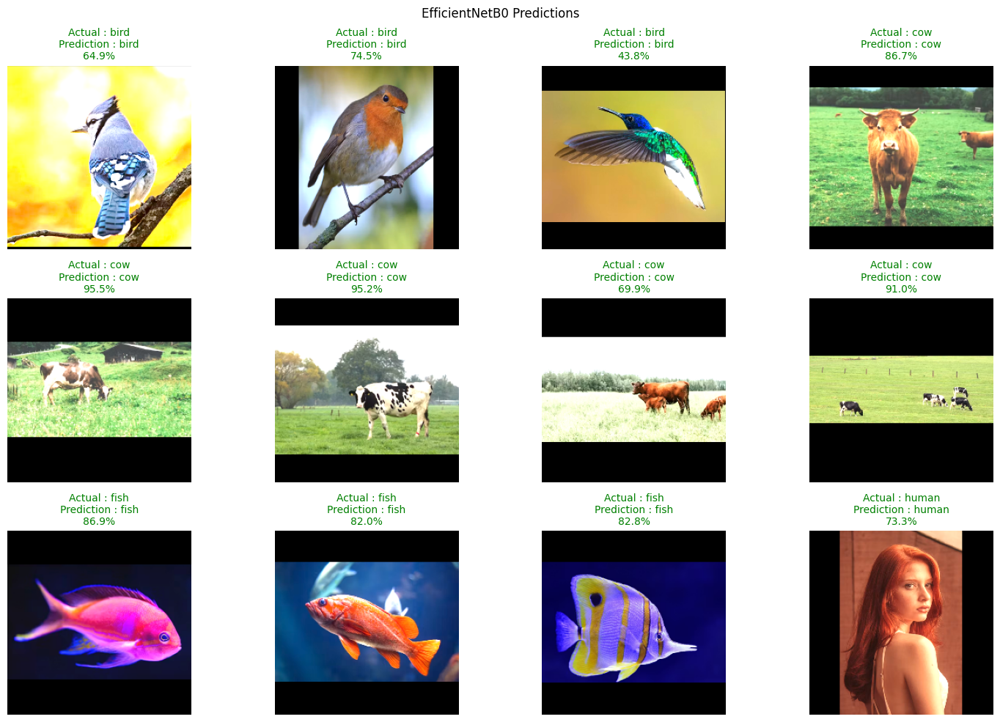


=== EfficientNetB7 ===


Model: "EfficientNetB7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb7 (Functional)     │ (None, 7, 7, 2560)     │    64,097,687 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_7      │ (None, 2560)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 2560)           │        10,240 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 2560)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 5)              │        12,805 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 64,120,732 (244.60 MB)

 Trainable params: 17,925 (70.02 KB)

 Non-trainable params: 64,102,807 (244.53 MB)


Training Classification Head - EfficientNetB7
Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.3889 - loss: 1.8969 - val_accuracy: 0.5263 - val_loss: 1.2661
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.8016 - loss: 0.5188 - val_accuracy: 0.7895 - val_loss: 1.0166
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.9286 - loss: 0.2060 - val_accuracy: 0.8947 - val_loss: 0.8525
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.9683 - loss: 0.1047 - val_accuracy: 0.8947 - val_loss: 0.7457
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.9921 - loss: 0.0478 - val_accuracy: 0.8947 - val_loss: 0.6736
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 1.0000 - loss: 0.0180 - val_accuracy: 0.8947 - val_loss: 0.6222
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.9921 - loss: 0.0245 - val_accuracy: 0.9474 - val_loss: 0.5830
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.9921 - loss: 0.0187 - val_accu

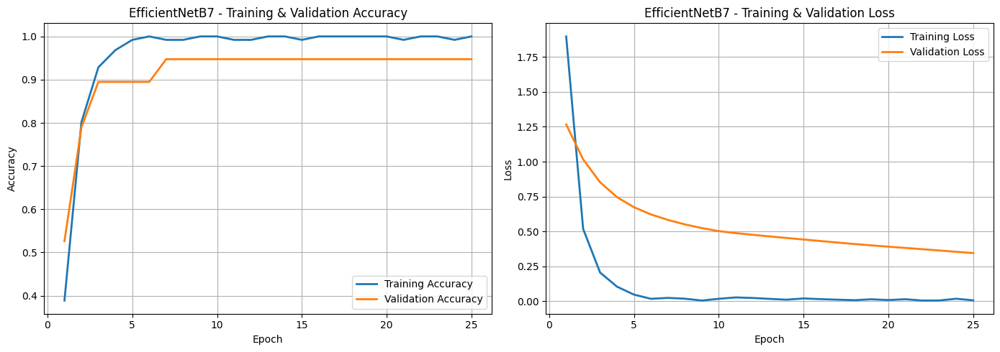

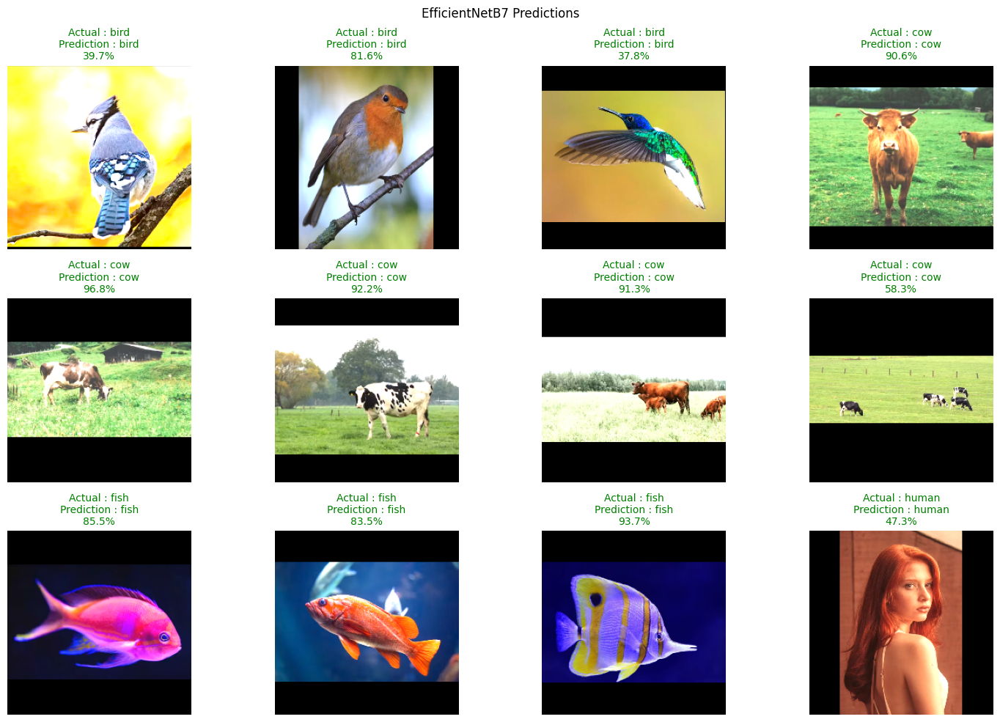


=== InceptionV3 ===


Model: "InceptionV3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_17 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_3 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_3 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_v3 (Functional)       │ (None, 5, 5, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_8      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_102         │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 5)              │        10,245 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,821,221 (83.24 MB)

 Trainable params: 14,341 (56.02 KB)

 Non-trainable params: 21,806,880 (83.19 MB)


Training Classification Head - InceptionV3
Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 638ms/step - accuracy: 0.2698 - loss: 2.4125 - val_accuracy: 0.2632 - val_loss: 1.5345
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - accuracy: 0.7143 - loss: 0.9186 - val_accuracy: 0.4737 - val_loss: 1.1363
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 271ms/step - accuracy: 0.8492 - loss: 0.4544 - val_accuracy: 0.6842 - val_loss: 0.8630
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - accuracy: 0.9206 - loss: 0.1934 - val_accuracy: 0.6842 - val_loss: 0.7048
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - accuracy: 0.9841 - loss: 0.0727 - val_accuracy: 0.7895 - val_loss: 0.5853
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 263ms/step - accuracy: 0.9841 - loss: 0.0586 - val_accuracy: 0.8421 - val_loss: 0.5047
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 258ms/step - accuracy: 0.9921 - loss: 0.0523 - val_accuracy: 0.8421 - val_loss: 0.4490
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - accuracy: 1.0000 - los

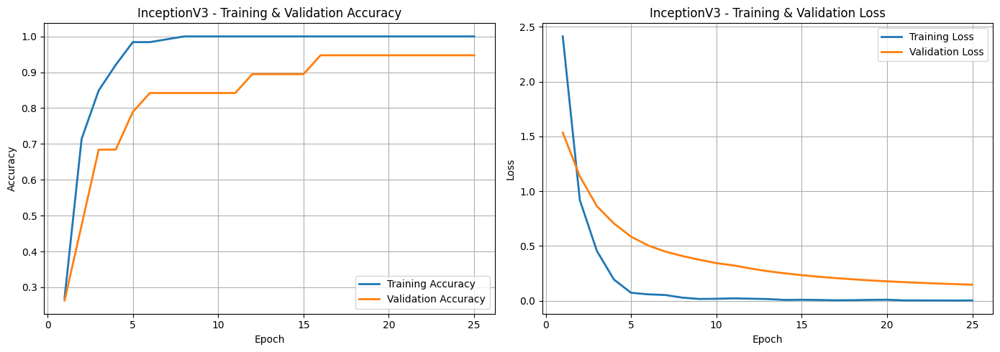

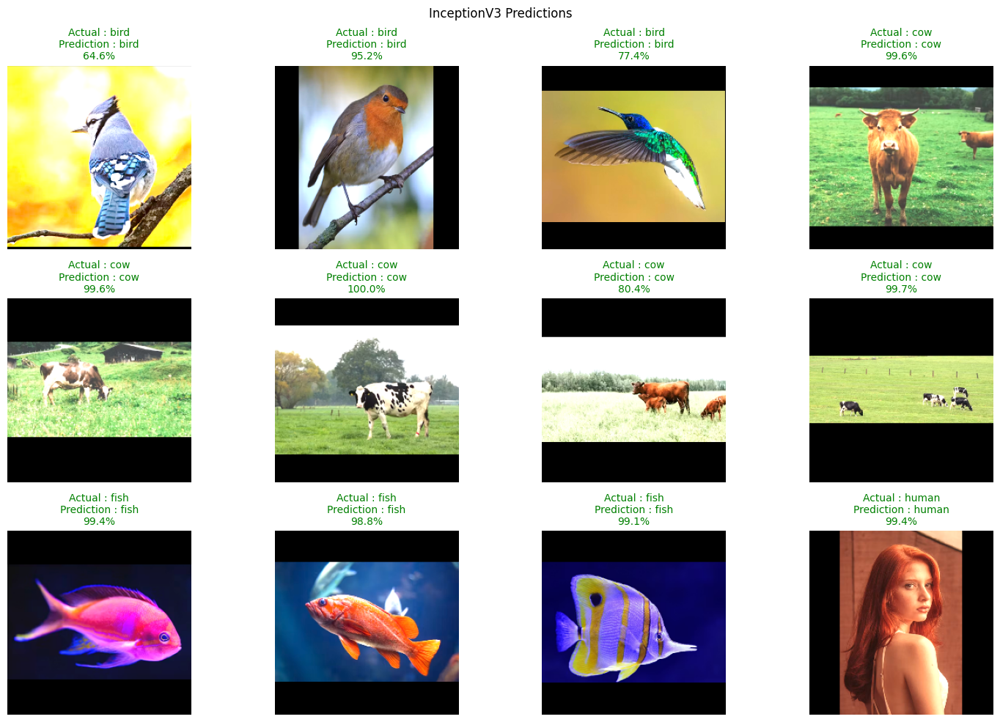


=== InceptionResNetV2 ===



Model: "InceptionResNetV2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_19 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_4 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_4 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_resnet_v2             │ (None, 5, 5, 1536)     │    54,336,736 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_9      │ (None, 1536)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_306         │ (None, 1536)           │         6,144 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 1536)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 5)              │         7,685 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 54,350,565 (207.33 MB)

 Trainable params: 10,757 (42.02 KB)

 Non-trainable params: 54,339,808 (207.29 MB)


Training Classification Head - InceptionResNetV2
Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step - accuracy: 0.3175 - loss: 2.2936 - val_accuracy: 0.5789 - val_loss: 1.0375
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 657ms/step - accuracy: 0.7063 - loss: 0.8267 - val_accuracy: 0.8947 - val_loss: 0.6200
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 662ms/step - accuracy: 0.9286 - loss: 0.3458 - val_accuracy: 0.8947 - val_loss: 0.4426
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 664ms/step - accuracy: 0.9524 - loss: 0.1556 - val_accuracy: 0.8947 - val_loss: 0.3434
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 665ms/step - accuracy: 1.0000 - loss: 0.0601 - val_accuracy: 0.8947 - val_loss: 0.2794
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 671ms/step - accuracy: 0.9921 - loss: 0.0576 - val_accuracy: 0.9474 - val_loss: 0.2355
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 658ms/step - accuracy: 0.9921 - loss: 0.0311 - val_accuracy: 0.9474 - val_loss: 0.2058
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 674ms/step - accuracy: 0.9921 -

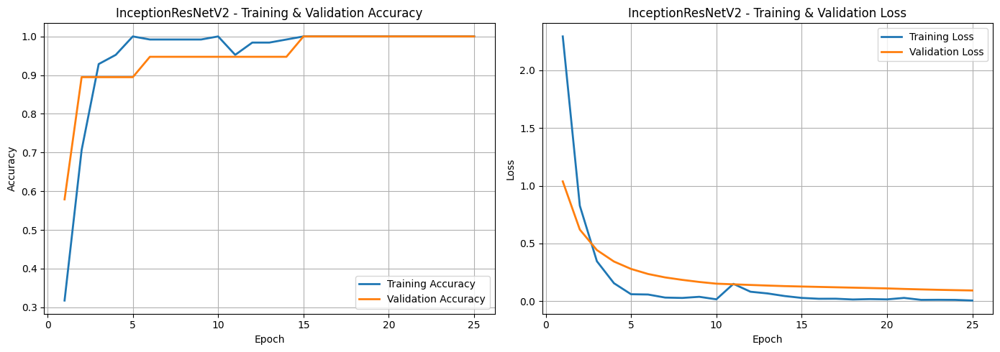

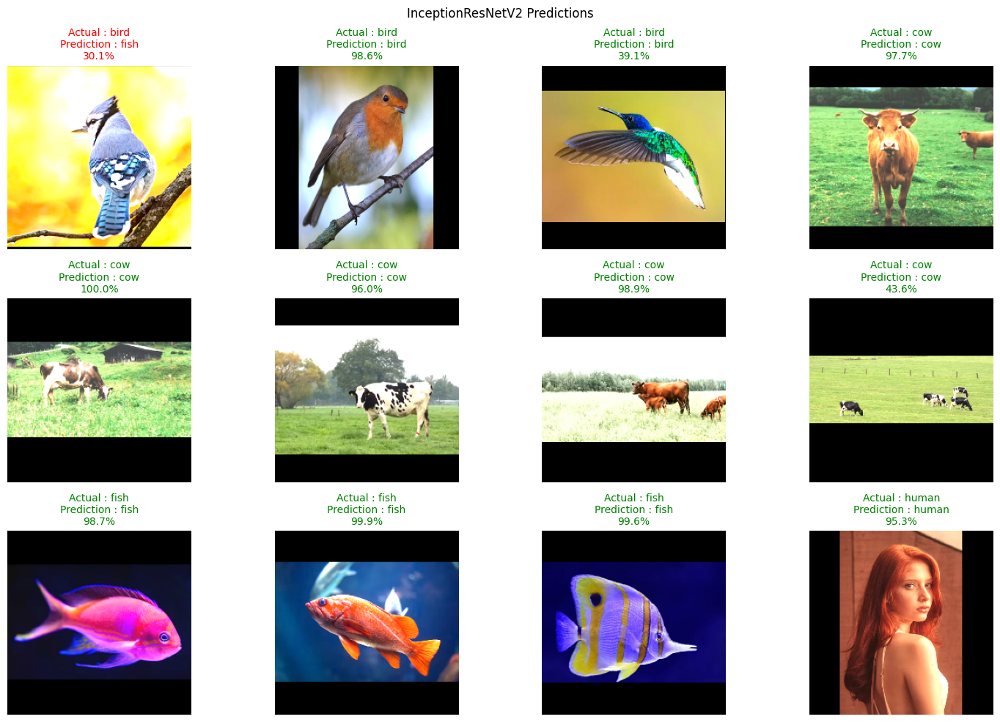

In [6]:
# Dictionary based architecture definitions, each with its own class and preprocess_input
ARCHITECTURES = {
    'ResNet50': (ResNet50, resnet_preprocess),
    'ResNet50V2': (ResNet50V2, resnet_v2_preprocess),
    'ResNet101': (ResNet101, resnet_preprocess),
    'MobileNet': (MobileNet, mobilenet_preprocess),
    'MobileNetV3Small': (MobileNetV3Small, mobilenet_v3_preprocess),
    'NASNetMobile': (NASNetMobile, nasnet_preprocess),
    'EfficientNetB0': (EfficientNetB0, efficientnet_preprocess),
    'EfficientNetB7': (EfficientNetB7, efficientnet_preprocess),
    'InceptionV3': (InceptionV3, inception_v3_preprocess),
    'InceptionResNetV2': (InceptionResNetV2, inception_resnet_v2_preprocess),
}

# Store per-model results for final comparison
all_histories_warmup = {}
all_histories_finetune = {}
all_test_results = {}
all_models = {}

for arch_name, (model_class, preprocess_input) in ARCHITECTURES.items():

    print(f"\n{'='*60}")
    print(f"=== {arch_name} ===")
    print(f"{'='*60}")

    # Build Model (1. Extraction Feature)

    # Load Pre-trained backbone without classification head
    base_model = model_class(
        weights='imagenet',
        include_top=False,
        input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3)
    )

    # Freeze All Layers
    base_model.trainable = False

    # Build Architecture
    inputs = layers.Input(shape=(IMG_SIZE[0], IMG_SIZE[1], 3))

    # Preprocessing Specific for each backbone
    x = preprocess_input(inputs)

    # Input to base model 
    x = base_model(x, training=False)

    # Classification Head Kustom
    x = layers.GlobalAveragePooling2D()(x)      # to decrease feature map
    x = layers.BatchNormalization()(x)          # re-scale result from GAP
    x = layers.Dropout(0.3)(x)                  # to avoid overfitting, drop several layers

    # Using Softmax Because Multiple Class
    outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)
    loss_fn = 'sparse_categorical_crossentropy'

    model = models.Model(inputs=inputs, outputs=outputs, name=arch_name)

    # Compile
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
        loss=loss_fn,
        metrics=['accuracy']
    )

    model.summary()

    # Warm-up Classification Head
    EPOCHS_WARMUP = 10

    callbacks = [
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss', 
            patience=3, 
            restore_best_weights=True
        )
    ]

    print(f"\nTraining Classification Head - {arch_name}")
    history_warmup = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=EPOCHS_WARMUP,
        callbacks=callbacks
    )

    # Fine Tuning (Unfreeze Top Layers)

    # Unfreeze base model
    base_model.trainable = True

    # Freeze Bottom layers, Open Top 30
    fine_tune_at = len(base_model.layers) - 30
    for layer in base_model.layers[:fine_tune_at]:
        layer.trainable = False

    # Re-compile model With Low Learning Rate
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
        loss=loss_fn,
        metrics=['accuracy']
    )

    # Continue Training (Fine-Tuning)
    EPOCHS_FINETUNE = 15
    TOTAL_EPOCHS = len(history_warmup.history['loss']) + EPOCHS_FINETUNE

    print(f"\nFine-Tuning Top Layers - {arch_name}")
    history_finetune = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=TOTAL_EPOCHS,
        initial_epoch=history_warmup.epoch[-1] + 1,
        callbacks=callbacks
    )

    # Evaluate
    test_loss, test_acc = model.evaluate(test_ds)
    print(f"{arch_name} - Test Loss: {test_loss:.4f}")
    print(f"{arch_name} - Test Accuracy: {test_acc:.4f}")

    # Visualize Loss and Accuracy

    # Combine history warmup and finetuning
    acc = history_warmup.history['accuracy'] + history_finetune.history['accuracy']
    val_acc = history_warmup.history['val_accuracy'] + history_finetune.history['val_accuracy']

    loss = history_warmup.history['loss'] + history_finetune.history['loss']
    val_loss = history_warmup.history['val_loss'] + history_finetune.history['val_loss']

    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(14,5))

    # Accuracy
    plt.subplot(1,2,1)
    plt.plot(epochs, acc, label='Training Accuracy', linewidth=2)
    plt.plot(epochs, val_acc, label='Validation Accuracy', linewidth=2)
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{arch_name} - Training & Validation Accuracy")
    plt.grid(True)
    plt.legend()

    # Loss
    plt.subplot(1,2,2)
    plt.plot(epochs, loss, label='Training Loss', linewidth=2)
    plt.plot(epochs, val_loss, label='Validation Loss', linewidth=2)
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{arch_name} - Training & Validation Loss")
    plt.grid(True)
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Visualize Prediction Result

    # Take 1 batch from test dataset
    images, labels = next(iter(test_ds))

    # Prediction
    predictions = model.predict(images, verbose=0)

    # Convert Prediction Result
    pred_labels = np.argmax(predictions, axis=1)
    confidences = np.max(predictions, axis=1)

    num_images = 12

    plt.figure(figsize=(15,10))

    for i in range(num_images):

        plt.subplot(3,4,i+1)

        image = images[i].numpy().astype("uint8")

        plt.imshow(image)

        true_label = class_names[int(labels[i])]
        pred_label = class_names[int(pred_labels[i])]
        confidence = confidences[i]*100

        color = "green" if true_label == pred_label else "red"

        plt.title(
            f"Actual : {true_label}\n"
            f"Prediction : {pred_label}\n"
            f"{confidence:.1f}%",
            color=color,
            fontsize=10
        )

        plt.axis("off")

    plt.suptitle(f"{arch_name} Predictions")
    plt.tight_layout()
    plt.show()

    # Save results for this architecture
    all_histories_warmup[arch_name] = history_warmup
    all_histories_finetune[arch_name] = history_finetune
    all_test_results[arch_name] = {'loss': test_loss, 'accuracy': test_acc}
    all_models[arch_name] = model

In [7]:
# Final Comparison Across All Architectures
print(f"\n{'='*60}")
print("=== FINAL COMPARISON ===")
print(f"{'='*60}")

for arch_name, result in sorted(all_test_results.items(), key=lambda x: x[1]['accuracy'], reverse=True):
    print(f"{arch_name:20s} | Test Acc: {result['accuracy']:.4f} | Test Loss: {result['loss']:.4f}")


=== FINAL COMPARISON ===
ResNet50             | Test Acc: 1.0000 | Test Loss: 0.0107
ResNet50V2           | Test Acc: 1.0000 | Test Loss: 0.0452
ResNet101            | Test Acc: 1.0000 | Test Loss: 0.0150
MobileNet            | Test Acc: 1.0000 | Test Loss: 0.0469
EfficientNetB7       | Test Acc: 1.0000 | Test Loss: 0.2790
NASNetMobile         | Test Acc: 0.9474 | Test Loss: 0.2305
EfficientNetB0       | Test Acc: 0.9474 | Test Loss: 0.3099
InceptionV3          | Test Acc: 0.9474 | Test Loss: 0.1288
InceptionResNetV2    | Test Acc: 0.9474 | Test Loss: 0.1776
MobileNetV3Small     | Test Acc: 0.8421 | Test Loss: 0.3531


In [9]:
# Compare Correct vs Wrong Predictions Across All Architectures (full test set)

comparison_results = {}

for arch_name, model in all_models.items():

    correct = 0
    wrong = 0
    y_true_all = []
    y_pred_all = []

    # Loop through entire test dataset (not just 1 batch)
    for images, labels in test_ds:
        predictions = model.predict(images, verbose=0)
        pred_labels = np.argmax(predictions, axis=1)

        y_true_all.extend(labels.numpy())
        y_pred_all.extend(pred_labels)

        correct += np.sum(pred_labels == labels.numpy())
        wrong += np.sum(pred_labels != labels.numpy())

    total = correct + wrong
    accuracy = correct / total

    comparison_results[arch_name] = {
        'correct': correct,
        'wrong': wrong,
        'total': total,
        'accuracy': accuracy,
        'y_true': y_true_all,
        'y_pred': y_pred_all
    }

    print(f"{arch_name:20s} | Correct: {correct:4d} | Wrong: {wrong:4d} | Accuracy: {accuracy:.4f}")

ResNet50             | Correct:   19 | Wrong:    0 | Accuracy: 1.0000
ResNet50V2           | Correct:   19 | Wrong:    0 | Accuracy: 1.0000
ResNet101            | Correct:   19 | Wrong:    0 | Accuracy: 1.0000
MobileNet            | Correct:   19 | Wrong:    0 | Accuracy: 1.0000
MobileNetV3Small     | Correct:   16 | Wrong:    3 | Accuracy: 0.8421
NASNetMobile         | Correct:   18 | Wrong:    1 | Accuracy: 0.9474
EfficientNetB0       | Correct:   18 | Wrong:    1 | Accuracy: 0.9474
EfficientNetB7       | Correct:   19 | Wrong:    0 | Accuracy: 1.0000
InceptionV3          | Correct:   18 | Wrong:    1 | Accuracy: 0.9474
InceptionResNetV2    | Correct:   18 | Wrong:    1 | Accuracy: 0.9474


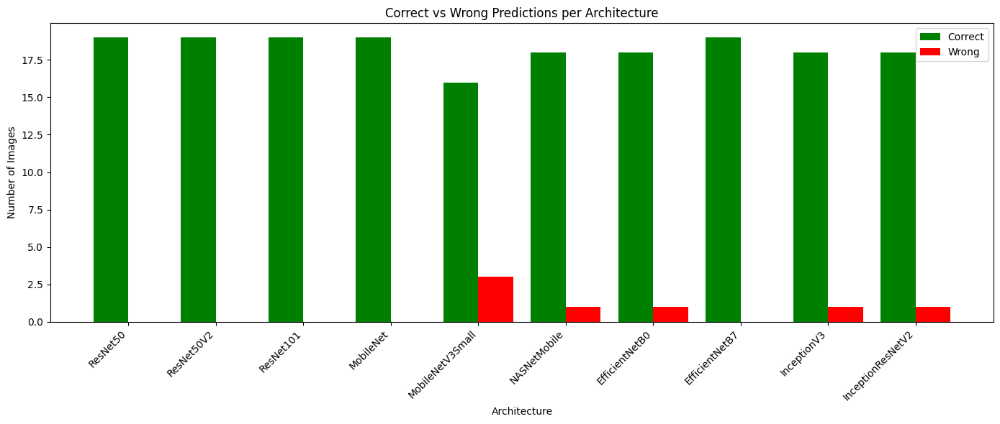

In [13]:
# Bar Chart Comparison - Correct vs Wrong per Architecture

arch_names = list(comparison_results.keys())
correct_counts = [comparison_results[name]['correct'] for name in arch_names]
wrong_counts = [comparison_results[name]['wrong'] for name in arch_names]

x = np.arange(len(arch_names))
width = 0.4

plt.figure(figsize=(14,6))
plt.bar(x - width/2, correct_counts, width, label='Correct', color='green')
plt.bar(x + width/2, wrong_counts, width, label='Wrong', color='red')

plt.xlabel("Architecture")
plt.ylabel("Number of Images")
plt.title("Correct vs Wrong Predictions per Architecture")
plt.xticks(x, arch_names, rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()